In [2]:
import pandas as pd
import numpy as np
import chart_studio.plotly as py
import seaborn as sns
import plotly.express as px
import cufflinks as cf

%matplotlib inline

from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
init_notebook_mode(connected=True)
cf.go_offline()

# Line plots

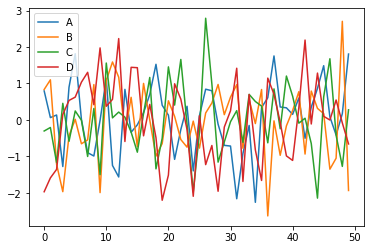

In [3]:
arr_1 = np.random.randn(50,4)
df_1 = pd.DataFrame(arr_1, columns=['A','B','C','D',])
df_1.head()
df_1.plot() #standard dataframe plot

In [4]:
df_1.iplot() #plotly plot - functionality and quality vastly increased

In [5]:
#line plots
import plotly.graph_objects as go
df_stocks = px.data.stocks()
px.line(df_stocks, x='date', y='GOOG', labels={'x': 'Date', 'y': 'Price'})

In [6]:
# compare 2 or multiple sets of data against each other 
px.line(df_stocks, x='date', y=['GOOG', 'AAPL'],
       labels={'x': 'Date', 'y': 'Price'}, title='Apple vs Google')

In [7]:
# more customisation with multiple columns from dataframe (different ticker symbols)
fig = go.Figure()

fig.add_trace(go.Scatter(x=df_stocks.date, y=df_stocks.AAPL,
                        mode='lines', name='Apple'))

fig.add_trace(go.Scatter(x=df_stocks.date, y=df_stocks.AMZN,
                        mode='lines+markers', name='Amazon'))

fig.add_trace(go.Scatter(x=df_stocks.date, y=df_stocks.GOOG,
                        mode='lines+markers', name='Google',
                        line=dict(color='firebrick', width=2,
                                 dash='dashdot')))

# add a title and add names for x and y axix
# fig.update_layout(title='Stock Price Data 2018 - 2020',
#                  xaxis_title='Price', yaxis_title='Date')

# further styling
fig.update_layout(
xaxis=dict(showline=True, showgrid=False, showticklabels=True,
linecolor='rgb(204,204,204)',
linewidth=2, ticks='outside', tickfont=dict(family='Arial',
                                            size=12, color='rgb(82,80,82)'),
),

yaxis=dict(showgrid=False, zeroline=False),
autosize=False, margin=dict(autoexpand=False, l=50, r=50, t=0, b=50),
                            showlegend=False, plot_bgcolor='White')

# Bar Charts

In [8]:
df_uk = px.data.gapminder().query('country == "United Kingdom"')
px.bar(df_uk, x='year', y='pop')

# stacked bar
df_tips = px.data.tips()
px.bar(df_tips, x='day', y='tip', color='sex', title='Tips by Sex on Each Day',
      labels={'tip':'tip amount', 'day':'day of the week'})

In [9]:
# european populations over 2 million (2.e6)
df_europe = px.data.gapminder().query("continent == 'Europe' and year == 2007 and pop > 2.e6")
fig=px.bar(df_europe, y='pop', x='country', text='pop', color='country')

#put pop total above bar
fig.update_traces(texttemplate='%{text:.2s}', textposition='outside') # labels on bars to 2 digits, outside bar
fig.update_layout(uniformtext_minsize=8)
fig.update_layout(xaxis_tickangle=-45)

fig

# Scatter Plots

In [10]:
df_iris = px.data.iris()
px.scatter(df_iris, x='sepal_width', y='sepal_length', color='species',
           size='petal_length', hover_data=['petal_width'])

# add more data
fig = go.Figure()
fig.add_trace(go.Scatter(
x=df_iris.sepal_width, y=df_iris.sepal_length,
mode='markers',
marker_color=df_iris.sepal_width,
text=df_iris.species, marker=dict(showscale=True)))

fig.update_traces(marker_line_width=2, marker_size=10)

# if working with massive dataset
fig = go.Figure(data=go.Scattergl(
x=np.random.randn(100000),
y=np.random.randn(100000),
mode='markers',
marker=dict(
color=np.random.randn(100000),
colorscale='Viridis',
line_width=1)))

fig

# Pie Charts

In [11]:
# df_asia = px.data.gapminder().query('year == 2007').query('continent == "Asia"')
# px.pie(df_asia, values='pop', names='country',
#       title='Population of Asian Continent',
#       color_discrete_sequence=px.colors.sequential.RdBu)

colors=['blue', 'green', 'black', 'purple', 'red', 'brown']
fig = go.Figure(data=[go.Pie(labels=['Water', 'Grass', 'Normal',
                                     'Psychic', 'Fire', 'Ground'],
                            values=[123,100,29,70,50,40])])

# stylise the plot - (pull out certain sections)
fig.update_traces(hoverinfo='label+percent', textfont_size=20,
                 textinfo='label+percent',
                  pull=[0.1, 0, 0.2,0, 0, 0], # pull out data by index in above colors list
                 marker=dict(colors=colors, line=dict(color='#ffffff',
                                                     width=2)))

# Histograms


In [12]:
dice_1 = np.random.randint(1,7,5000)
dice_2 = np.random.randint(1,7,5000)

dice_sum = dice_1 + dice_2

fig = px.histogram(dice_sum, nbins=11,
                   labels={'value': 'Dice Roll'},
                  title='5000 Dice Roll Histogram',
                  marginal='violin',
                  color_discrete_sequence=['green'])

#stylise the plot
fig.update_layout(
xaxis_title_text='Dice Roll',
yaxis_title_text='Dice Sum',
bargap=0.2, showlegend=False)

fig

###########################

# # stack your bars using the tips data from above
# df_tips = px.data.tips()
# px.histogram(df_tips, x='total_bill',
#             color='sex')


# Box Plots

In [13]:
# box plots show median, quartiles, the rest of the main data, and outliers outside of the 'whiskers'

df_tips = px.data.tips()
px.box(df_tips, x='sex', y='tip', points='all')

px.box(df_tips, x='day', y='tip', color='sex')

# multiple traces / options, use 'add_trace'
fig = go.Figure()
fig.add_trace(go.Box(x=df_tips.sex, y=df_tips.tip,
                     marker_color='blue', boxmean='sd'))

# complicated styling
df_stocks = px.data.stocks()
fig = go.Figure()
fig.add_trace(go.Box(y=df_stocks.GOOG, boxpoints='all',
                    fillcolor='blue', jitter=0.5,
                    whiskerwidth=0.2))

fig.add_trace(go.Box(y=df_stocks.AAPL, boxpoints='all',
                    fillcolor='red', jitter=0.5,
                    whiskerwidth=0.2))

fig.update_layout(title='Google vs Apple',
                 yaxis=dict(gridcolor='rgb(255,255,255)',
                           gridwidth=3),
                  paper_bgcolor='rgb(243,243,243)',
                  plot_bgcolor='rgb(243,243,243)')

 # Violin Plot

In [14]:
df_tips = px.data.tips()
px.violin(df_tips, y='total_bill', box=False, points='all')

# Density Heatmaps

In [15]:
flights = sns.load_dataset('flights')
flights

fig = px.density_heatmap(flights, x='year', y='month',
                        z='passengers', color_continuous_scale='Viridis')

# # add histogram to top/bottom
# fig = px.density_heatmap(flights, x='year', y='month',
#                         z='passengers',
#                         marginal_x='histogram')

fig

# 3D Scatter Plot

In [16]:
fig = px.scatter_3d(flights, x='year', y='month', z='passengers',
                   color='year', opacity=0.7)
fig

# 3D Line

In [17]:
fig = px.line_3d(flights, x='year', y='month', z='passengers',
                   color='year')
fig

# Scatter Matrix 

In [18]:
fig = px.scatter_matrix(flights, color='month')
fig

# Map Scatter Plots

In [19]:
df = px.data.gapminder().query("year == 2007")
fig = px.scatter_geo(df, locations='iso_alpha',
                  color='continent',
                  hover_name='country',
                  size='pop',
                  projection='orthographic')
fig

# Animated Plots

In [21]:
df_cnt = px.data.gapminder()

# GDP per capita scatter plot
px.scatter(df_cnt, x='gdpPercap', y='lifeExp',
          animation_frame='year',
          animation_group='country',
          size='pop', color='continent', hover_name='country',
          log_x=True, size_max=55, range_x=[100,100000],
          range_y=[25,90])

# # population growth bar chart
# px.bar(df_cnt, x='continent', y='pop', color='continent',
#       animation_frame='year', animation_group='country',
#       range_y=[0,4000000000])